# Objective: fine-tuning DETR

-   This notebook can be found on my Github profile: https://github.com/woctezuma/finetune-detr
-   Official DETR repository: https://github.com/facebookresearch/detr
-   Discussion about fine-tuning in [a Github issue](https://github.com/facebookresearch/detr/issues/9).
-   A nice blog post about another approach (Mask R-CNN) and the balloon dataset (which we use in this notebook): [here](https://engineering.matterport.com/splash-of-color-instance-segmentation-with-mask-r-cnn-and-tensorflow-7c761e238b46).

## Define useful boilerplate functions

Adapted from:
-   https://colab.research.google.com/github/facebookresearch/detr/blob/colab/notebooks/detr_attention.ipynb

In [1]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

torch.set_grad_enabled(False);

2.4.0+cu121 True


In [2]:
import torchvision.transforms as T

# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [3]:
def filter_bboxes_from_outputs(outputs,
                               threshold=0.7):

  # keep only predictions with confidence above threshold
  probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values > threshold

  probas_to_keep = probas[keep]

  # convert boxes from [0; 1] to image scales
  bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)

  return probas_to_keep, bboxes_scaled

In [4]:
# COCO classes
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

In [5]:
import matplotlib.pyplot as plt

def plot_results(pil_img, prob=None, boxes=None):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    if prob is not None and boxes is not None:
      for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
          ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                    fill=False, color=c, linewidth=3))
          cl = p.argmax()
          text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
          ax.text(xmin, ymin, text, fontsize=15,
                  bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

## Load an image for a demo

In [6]:
model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
model.eval();

Downloading: "https://github.com/facebookresearch/detr/zipball/main" to /root/.cache/torch/hub/main.zip
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 159MB/s]
Downloading: "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" to /root/.cache

In [7]:
from PIL import Image
import requests

url = 'http://images.cocodataset.org/train2017/000000310645.jpg'
im = Image.open(requests.get(url, stream=True).raw)

In [8]:
# mean-std normalize the input image (batch-size: 1)
img = transform(im).unsqueeze(0)

# propagate through the model
outputs = model(img)

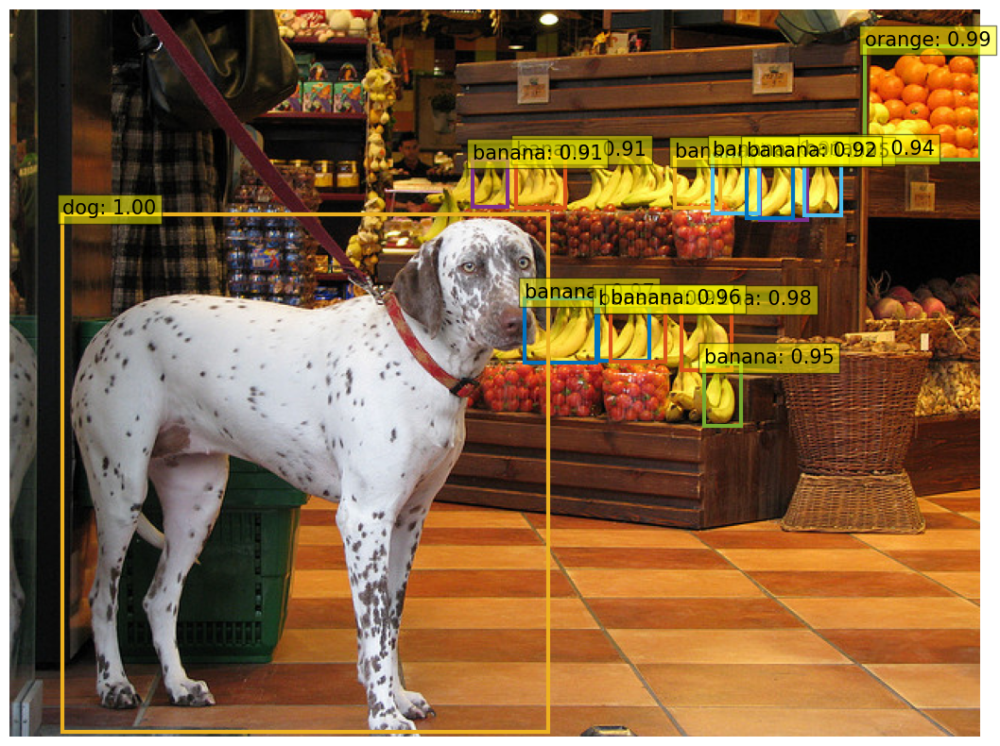

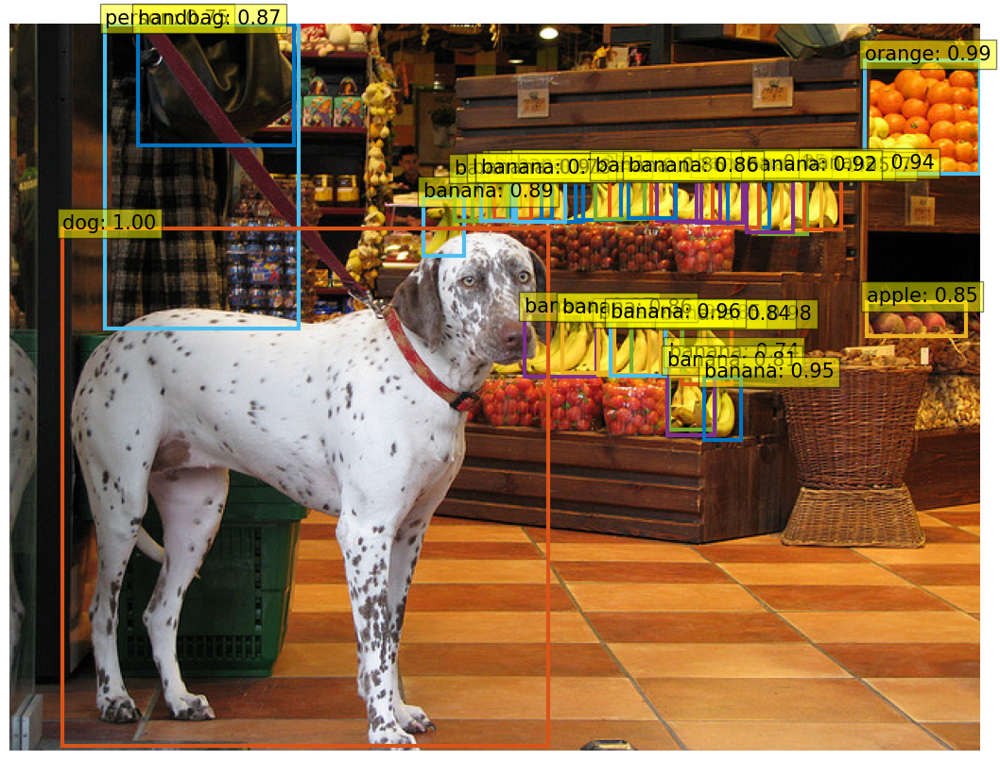

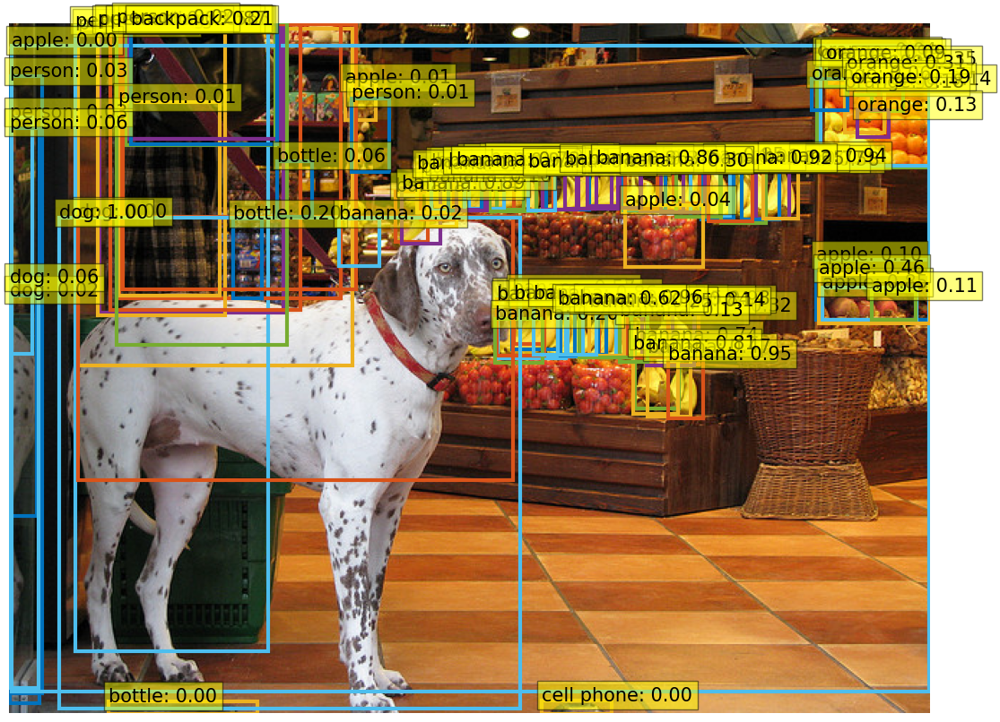

In [9]:
for threshold in [0.9, 0.7, 0.0]:

  probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs,
                                                            threshold=threshold)

  plot_results(im, probas_to_keep, bboxes_scaled)

NB: if the threshold is equal to zero, then you will see all of the 100 query slots. The zero-threshold is only used for illustration. In usual cases, most query slots have a low confidence score, so that irrelevant query slots would be pruned with a higher threshold, such as 0.7 or 0.9.

Reference: https://github.com/facebookresearch/detr/issues/9#issuecomment-635357693

NB²: For fine-tuning purposes, we cannot change the number of query slots.

> If you're fine-tuning, I don't recommend changing the number of queries on the fly, it is extremely unlikely to work out of the box. In this case you're probably better off retraining from scratch (you can change the --num_queries arg from our training script).

Reference: https://github.com/facebookresearch/detr/issues/9#issuecomment-636407752

## Clone my custom code of DETR

Clone [my fork](https://github.com/woctezuma/detr/tree/finetune) tailored for a custom dataset:
-   called `custom`,
-   with `max_class_id = 2` ([explanation](https://github.com/facebookresearch/detr/issues/108#issuecomment-650269223)).

**Caveat**: if you later use `first_class_index = 1` for your dataset, then it is fine. However, if you later use `first_class_index = 0`, then you will have to override the value of `max_class_id` (so that it is equal to 1) when calling `!python main.py`. My fork can do that.


In [10]:
%cd /content/

!rm -rf detr
!git clone https://github.com/woctezuma/detr.git

%cd detr/

!git checkout finetune

/content
Cloning into 'detr'...
remote: Enumerating objects: 265, done.
remote: Total 265 (delta 0), reused 0 (delta 0), pack-reused 265 (from 1)
Receiving objects: 100% (265/265), 325.44 KiB | 10.17 MiB/s, done.
Resolving deltas: 100% (127/127), done.
/content/detr
Already on 'finetune'
Your branch is up to date with 'origin/finetune'.


## Load pre-trained weights

Load a check-point (urls can be found [here](https://github.com/facebookresearch/detr#model-zoo)), then remove the classification head.

In [11]:
# Get pretrained weights
checkpoint = torch.hub.load_state_dict_from_url(
            url='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth',
            map_location='cpu',
            check_hash=True)

# Remove class weights
del checkpoint["model"]["class_embed.weight"]
del checkpoint["model"]["class_embed.bias"]

# Save
torch.save(checkpoint,
           'detr-r50_no-class-head.pth')

## Prepare the dataset for fine-tuning

The `balloon` dataset will be used. It is featured here and uses VIA format:
-   https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon


You can choose whether to start indexing categories with 0 or with 1.

This is a matter of taste, and it should not impact the performance of the algorithm.

In [12]:
# Choose whether to start indexing categories with 0 or with 1.
#
# NB: convention in COCO dataset is such that the 1st class (person) has ID n°1.
#
# NB²: this is why we chose to set to 1 the default value of `first_class_index`
# in `via2coco.convert()`.

first_class_index = 0

Clone [my fork](https://github.com/woctezuma/VIA2COCO/tree/fixes) to convert annotations from VIA format to COCO format.

In [13]:
%cd /content/

!rm -rf VIA2COCO
!git clone https://github.com/woctezuma/VIA2COCO

%cd VIA2COCO/

!git checkout fixes

/content
Cloning into 'VIA2COCO'...
remote: Enumerating objects: 63, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 63 (delta 25), reused 36 (delta 20), pack-reused 20 (from 1)
Receiving objects: 100% (63/63), 16.41 KiB | 2.34 MiB/s, done.
Resolving deltas: 100% (32/32), done.
/content/VIA2COCO
Already on 'fixes'
Your branch is up to date with 'origin/fixes'.


In [14]:
import os

os.makedirs('/content/data/custom/', exist_ok=True)

!wget https://s3.amazonaws.com/ifashionist-dataset/images/train2020.zip -O /content/data/custom/train2020.zip

--2024-08-30 22:22:24--  https://s3.amazonaws.com/ifashionist-dataset/images/train2020.zip
Resolving s3.amazonaws.com (s3.amazonaws.com)... 3.5.23.157, 54.231.168.88, 54.231.139.32, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|3.5.23.157|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3344364592 (3.1G) [application/zip]
Saving to: ‘/content/data/custom/train2020.zip’

/content/data/custo 100%[===================>]   3.11G  22.9MB/s    in 3m 16s  

2024-08-30 22:25:40 (16.3 MB/s) - ‘/content/data/custom/train2020.zip’ saved [3344364592/3344364592]



In [15]:
!unzip /content/data/custom/train2020.zip -d /content/data/custom/ > /dev/null

In [16]:
!wget https://s3.amazonaws.com/ifashionist-dataset/images/val_test2020.zip -O /content/data/custom/val_test2020.zip

--2024-08-30 22:28:20--  https://s3.amazonaws.com/ifashionist-dataset/images/val_test2020.zip
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.210.184, 54.231.233.144, 52.217.117.48, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.210.184|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 236499034 (226M) [application/zip]
Saving to: ‘/content/data/custom/val_test2020.zip’

/content/data/custo 100%[===================>] 225.54M  30.6MB/s    in 7.3s    

2024-08-30 22:28:27 (31.1 MB/s) - ‘/content/data/custom/val_test2020.zip’ saved [236499034/236499034]



In [17]:
!unzip /content/data/custom/val_test2020.zip -d /content/data/custom/ > /dev/null

In [18]:

!mv /content/data/custom/test /content/data/custom/val2017
!mv /content/data/custom/train /content/data/custom/train2017

In [19]:
os.makedirs('/content/data/custom/annotations', exist_ok=True)

In [20]:
!wget https://s3.amazonaws.com/ifashionist-dataset/annotations/instances_attributes_train2020.json -O /content/data/custom/annotations/instances_attributes_train2020.json
!wget https://s3.amazonaws.com/ifashionist-dataset/annotations/instances_attributes_val2020.json -O /content/data/custom/annotations/instances_attributes_val2020.json

--2024-08-30 22:28:31--  https://s3.amazonaws.com/ifashionist-dataset/annotations/instances_attributes_train2020.json
Resolving s3.amazonaws.com (s3.amazonaws.com)... 3.5.8.25, 54.231.202.120, 16.182.65.144, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|3.5.8.25|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 542193045 (517M) [application/json]
Saving to: ‘/content/data/custom/annotations/instances_attributes_train2020.json’

/content/data/custo 100%[===================>] 517.08M  21.9MB/s    in 22s     

2024-08-30 22:28:53 (23.8 MB/s) - ‘/content/data/custom/annotations/instances_attributes_train2020.json’ saved [542193045/542193045]

--2024-08-30 22:28:53--  https://s3.amazonaws.com/ifashionist-dataset/annotations/instances_attributes_val2020.json
Resolving s3.amazonaws.com (s3.amazonaws.com)... 3.5.24.17, 52.216.251.6, 52.216.217.24, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|3.5.24.17|:443... connected.
HTTP request sent, awaiting respo

In [21]:
!mv /content/data/custom/annotations/instances_attributes_train2020.json /content/data/custom/annotations/custom_train.json
!mv /content/data/custom/annotations/instances_attributes_val2020.json /content/data/custom/annotations/custom_val.json


We expect the directory structure to be the following:
```
path/to/coco/
├ annotations/  # JSON annotations
│  ├ annotations/custom_train.json
│  └ annotations/custom_val.json
├ train2017/    # training images
└ val2017/      # validation images
```

## Check the dataset after it was pre-processed for fine-tuning

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:
-   Demo of COCO API: https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocoDemo.ipynb

In [22]:
%matplotlib inline
import pycocotools.coco as coco
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
pylab.rcParams['figure.figsize'] = (10.0, 8.0)

In [23]:
dataDir='/content/data/custom/'
dataType='train2017'
annFile='{}annotations/custom_train.json'.format(dataDir)

In [24]:
# initialize COCO api for instance annotations
coco=COCO(annFile)

loading annotations into memory...
Done (t=9.07s)
creating index...
index created!


In [47]:
coco

In [25]:
# display COCO categories and supercategories
cats = coco.loadCats(coco.getCatIds())

nms=[cat['name'] for cat in cats]
print('Categories: {}'.format(nms))

nms = set([cat['supercategory'] for cat in cats])
print('Super-categories: {}'.format(nms))

Categories: ['shirt, blouse', 'top, t-shirt, sweatshirt', 'sweater', 'cardigan', 'jacket', 'vest', 'pants', 'shorts', 'skirt', 'coat', 'dress', 'jumpsuit', 'cape', 'glasses', 'hat', 'headband, head covering, hair accessory', 'tie', 'glove', 'watch', 'belt', 'leg warmer', 'tights, stockings', 'sock', 'shoe', 'bag, wallet', 'scarf', 'umbrella', 'hood', 'collar', 'lapel', 'epaulette', 'sleeve', 'pocket', 'neckline', 'buckle', 'zipper', 'applique', 'bead', 'bow', 'flower', 'fringe', 'ribbon', 'rivet', 'ruffle', 'sequin', 'tassel']
Super-categories: {'head', 'waist', 'neck', 'wholebody', 'lowerbody', 'arms and hands', 'legs and feet', 'decorations', 'closures', 'garment parts', 'upperbody', 'others'}


In [26]:
# load and display image
catIds = coco.getCatIds(catNms=['dress']);
imgIds = coco.getImgIds(catIds=catIds );

In [27]:
coco.imgs

{16145: {'id': 16145,
  'width': 1024,
  'height': 1024,
  'file_name': '6ce91b2c047f7f441edd5dc17326ae17.jpg',
  'license': 2,
  'time_captured': 'March-August, 2018',
  'original_url': 'https://farm4.staticflickr.com/3723/32517258013_5dbb981cfb_o.jpg',
  'isstatic': 1,
  'kaggle_id': '6ce91b2c047f7f441edd5dc17326ae17'},
 12446: {'id': 12446,
  'width': 682,
  'height': 1024,
  'file_name': 'da3618863549ca1db90583f33d1d0664.jpg',
  'license': 0,
  'time_captured': 'March-August, 2018',
  'original_url': 'http://farm6.staticflickr.com/5785/22380918021_1de24ef099_n.jpg',
  'isstatic': 1,
  'kaggle_id': 'da3618863549ca1db90583f33d1d0664'},
 17264: {'id': 17264,
  'width': 1024,
  'height': 682,
  'file_name': '23eb1448530add24409ed669467925c2.jpg',
  'license': 2,
  'time_captured': 'March-August, 2018',
  'original_url': 'http://farm5.staticflickr.com/4532/27130135789_6939e88431_n.jpg',
  'isstatic': 1,
  'kaggle_id': '23eb1448530add24409ed669467925c2'},
 10359: {'id': 10359,
  'width':

Image n°32771
Image name: /content/data/custom//train2017/2bde2ba21c4b70edff1aa9ef218c4de8.jpg


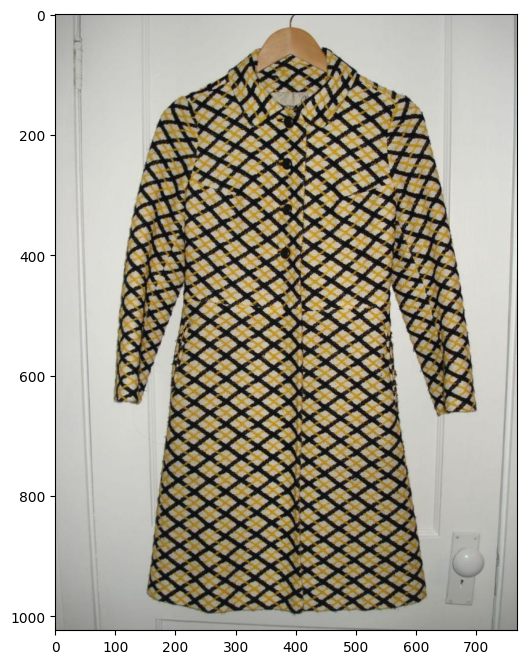

In [28]:
img_id = imgIds[1]
print('Image n°{}'.format(img_id))

img = coco.loadImgs(img_id)[0]

img_name = '%s/%s/%s'%(dataDir, dataType, img['file_name'])
print('Image name: {}'.format(img_name))

I = io.imread(img_name)
plt.figure()
plt.imshow(I)

In [29]:
annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds)
anns = coco.loadAnns(annIds)

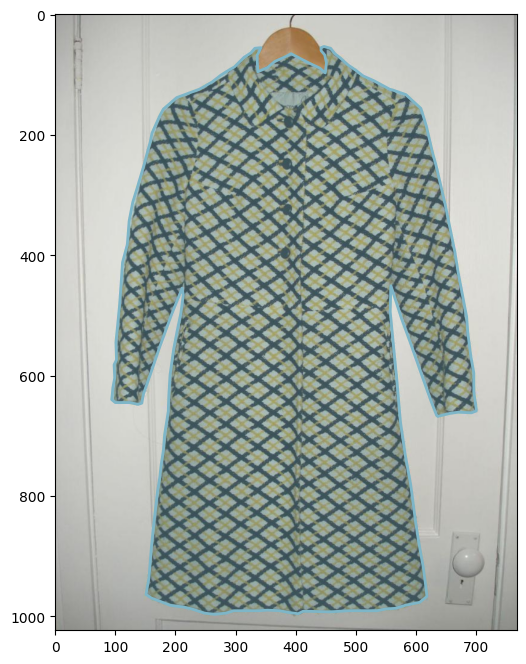

In [30]:
# load and display instance annotations
plt.imshow(I)
coco.showAnns(anns, draw_bbox=False)

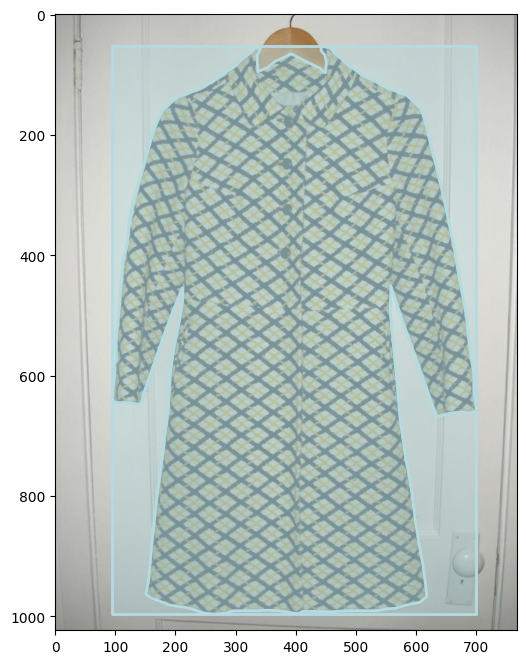

In [31]:
plt.imshow(I)
coco.showAnns(anns, draw_bbox=True)

## Fine-tuning

-   Instructions appear in [a Github Gist](https://gist.github.com/woctezuma/e9f8f9fe1737987351582e9441c46b5d).

NB: There is a `--frozen_weights` argument. However,
i) I have yet to figure out how it is used,
ii) it is of no use for box detection. Indeed, "frozen training is meant for segmentation only" (as mentioned at this [line](https://github.com/facebookresearch/detr/blob/f4cdc542de34de771da8b9189742e5465f5220cd/main.py#L110) of the source-code).

### Boilerplate variables

**Caveat**: the parameter name `num_classes` is misleading. It is actually the ID which DETR will reserve for **its own** `no_object` class.

It should be set to one plus the highest class ID in your dataset.

For instance, if you have one class (balloon):
- if you used the index n°0 for this class, then `max_id = 0` and `num_classes = max_id+1 = 1`
- if you used the index n°1 for this class, then `max_id = 1` and `num_classes = max_id+1 = 2`

Reference: https://github.com/facebookresearch/detr/issues/108#issuecomment-650269223

In [32]:
import json

info = json.load(open(annFile))

In [33]:
dress_object = [obj for obj in info["categories"] if obj['name'] == 'dress']

In [34]:
dress_object

[{'id': 10,
  'name': 'dress',
  'supercategory': 'wholebody',
  'level': 2,
  'taxonomy_id': 'obj000018_00'}]

In [35]:
id_dres = dress_object[0]["id"]

dress_object[0]["id"] = 0
info["categories"] = dress_object

del info["categories"][0]["level"]
del info["categories"][0]["taxonomy_id"]
info["categories"][0]["supercategory"] = 'N/A'

filtered_objects = []
image_ids = []

for obj in info["annotations"]:
    if obj['category_id'] == id_dres:
        obj["category_id"] = 0
        filtered_objects.append(obj)
        image_ids.append(obj['image_id'])
        del obj["attribute_ids"]

filtered_objects = filtered_objects[:200]
image_ids = image_ids[:200]

filtered_image_ids = [obj for obj in info["images"] if obj['id'] in image_ids]

info["annotations"] = filtered_objects
info["images"] = filtered_image_ids

del info['attributes']

with open('/content/data/custom/annotations/custom_train.json', 'w') as outfile:
    json.dump(info, outfile)

In [36]:
len(image_ids)

200

In [37]:
filtered_objects

[{'image_id': 18875,
  'category_id': 0,
  'segmentation': [[333,
    556,
    355,
    543,
    381,
    541,
    404,
    549,
    413,
    564,
    425,
    535,
    431,
    505,
    427,
    474,
    403,
    434,
    389,
    406,
    359,
    320,
    341,
    255,
    334,
    310,
    329,
    369,
    324,
    384,
    323,
    424,
    322,
    438,
    325,
    514,
    321,
    562],
   [268, 558, 277, 582, 289, 579, 296, 578, 281, 567, 267, 551],
   [260, 530, 262, 539, 268, 548, 270, 536, 262, 530]],
  'bbox': [260.0, 257.0, 171.0, 325.0],
  'area': 18614,
  'iscrowd': 0,
  'id': 10},
 {'image_id': 20443,
  'category_id': 0,
  'segmentation': [[343,
    622,
    339,
    628,
    324,
    634,
    300,
    634,
    295,
    630,
    285,
    633,
    283,
    628,
    265,
    625,
    254,
    622,
    236,
    619,
    231,
    618,
    236,
    649,
    229,
    645,
    220,
    629,
    218,
    619,
    216,
    608,
    218,
    600,
    215,
    573,
    212,
   

In [38]:
import json

info = json.load(open("/content/data/custom/annotations/custom_val.json"))

In [39]:
dress_object = [obj for obj in info["categories"] if obj['name'] == 'dress']
dress_object

[{'id': 10,
  'name': 'dress',
  'supercategory': 'wholebody',
  'level': 2,
  'taxonomy_id': 'obj000018_00'}]

In [40]:

id_dres = dress_object[0]["id"]

dress_object[0]["id"] = 0
info["categories"] = dress_object

del info["categories"][0]["level"]
del info["categories"][0]["taxonomy_id"]
info["categories"][0]["supercategory"] = 'N/A'

filtered_objects = []
image_ids = []

for obj in info["annotations"]:
    if obj['category_id'] == id_dres:
        obj["category_id"] = 0
        filtered_objects.append(obj)
        image_ids.append(obj['image_id'])
        del obj["attribute_ids"]

image_ids = image_ids[:200]

filtered_objects = filtered_objects[:50]
image_ids = image_ids[:50]

filtered_image_ids = [obj for obj in info["images"] if obj['id'] in image_ids]

info["annotations"] = filtered_objects
info["images"] = filtered_image_ids

del info['attributes']

with open('/content/data/custom/annotations/custom_val.json', 'w') as outfile:
    json.dump(info, outfile)

In [41]:
import json

info = json.load(open(annFile))

In [42]:
info.keys()

dict_keys(['annotations', 'images', 'info', 'licenses', 'categories'])

In [43]:
assert(first_class_index in [0, 1])

if len(info["categories"]) == 46:

  # There is one class, balloon, with ID n°0.

  num_classes = 46 + 1

  finetuned_classes = [
      'N/A',
      'shirt, blouse',
      'top, t-shirt, sweatshirt',
      'sweater', 'cardigan',
      'jacket', 'vest', 'pants',
      'shorts', 'skirt', 'coat',
      'dress', 'jumpsuit', 'cape',
      'glasses', 'hat', 'headband, head covering, hair accessory',
      'tie', 'glove', 'watch', 'belt', 'leg warmer', 'tights, stockings',
      'sock', 'shoe', 'bag, wallet', 'scarf', 'umbrella', 'hood', 'collar',
      'lapel', 'epaulette', 'sleeve', 'pocket', 'neckline', 'buckle', 'zipper',
      'applique', 'bead', 'bow', 'flower', 'fringe', 'ribbon', 'rivet', 'ruffle', 'sequin', 'tassel'
  ]

  # The `no_object` class will be automatically reserved by DETR with ID equal
  # to `num_classes`, so ID n°1 here.

else:

  # There is one class, balloon, with ID n°1.
  #
  # However, DETR assumes that indexing starts with 0, as in computer science,
  # so there is a dummy class with ID n°0.
  # Caveat: this dummy class is not the `no_object` class reserved by DETR.

  num_classes = 1

  finetuned_classes = ['dress',]

  # The `no_object` class will be automatically reserved by DETR with ID equal
  # to `num_classes`, so ID n°2 here.

print('First class index: {}'.format(first_class_index))
print('Parameter num_classes: {}'.format(num_classes))
print('Fine-tuned classes: {}'.format(finetuned_classes))

First class index: 0
Parameter num_classes: 1
Fine-tuned classes: ['dress']


In [44]:
%cd /content/detr/

/content/detr


**Caveat**: below, we override the value of `num_classes` (hard-coded to 2 for the `custom` dataset in my `finetune` branch of DETR) in case `first_class_index = 0` instead of `first_class_index = 1` (default value).

In [48]:
!python main.py \
  --dataset_file "custom" \
  --coco_path "/content/data/custom/" \
  --output_dir "outputs" \
  --resume "detr-r50_no-class-head.pth" \
  --num_classes $num_classes \
  --epochs 10 \
  --batch_size 4

Not using distributed mode
git:
  sha: e891373a8cab93d3719afb0acff28de94c6dc6a3, status: has uncommited changes, branch: finetune

Namespace(lr=0.0001, lr_backbone=1e-05, batch_size=4, weight_decay=0.0001, epochs=10, lr_drop=200, clip_max_norm=0.1, frozen_weights=None, backbone='resnet50', dilation=False, position_embedding='sine', enc_layers=6, dec_layers=6, dim_feedforward=2048, hidden_dim=256, dropout=0.1, nheads=8, num_queries=100, pre_norm=False, masks=False, aux_loss=True, set_cost_class=1, set_cost_bbox=5, set_cost_giou=2, mask_loss_coef=1, dice_loss_coef=1, bbox_loss_coef=5, giou_loss_coef=2, eos_coef=0.1, num_classes=1, dataset_file='custom', coco_path='/content/data/custom/', coco_panoptic_path=None, remove_difficult=False, output_dir='outputs', device='cuda', seed=42, resume='detr-r50_no-class-head.pth', start_epoch=0, eval=False, num_workers=2, world_size=1, dist_url='env://', distributed=False)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserW

## Check the results

### Monitoring of training

Reference: https://github.com/lessw2020/Thunder-Detr/blob/master/View_your_training_results.ipynb

In [ ]:
from util.plot_utils import plot_logs

from pathlib import Path

log_directory = [Path('outputs/')]

As mentioned in the code of [`plot_logs`](https://github.com/facebookresearch/detr/blob/5e66b4cd15b2b182da347103dd16578d28b49d69/util/plot_utils.py#L13):
-   solid lines are training results,
-   dashed lines are validation results.

DataError: Cannot aggregate non-numeric type: object

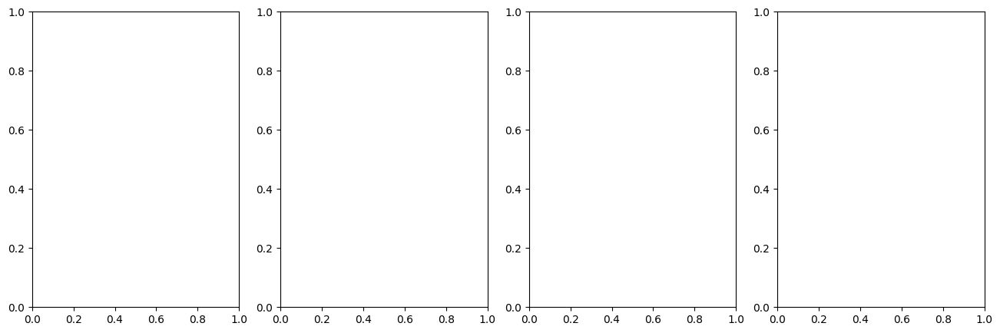

In [ ]:
fields_of_interest = (
    'loss'
    )

plot_logs(log_directory, fields_of_interest)

In [ ]:
fields_of_interest = (
    'loss_ce',
    'loss_bbox',
    'loss_giou',
    )

plot_logs(log_directory,
          fields_of_interest)

NameError: name 'plot_logs' is not defined

In [ ]:
fields_of_interest = (
    'class_error',
    'cardinality_error_unscaled',
    )

plot_logs(log_directory,
          fields_of_interest)

### Load the fine-tuned model

- How to replace the classification head: https://github.com/facebookresearch/detr/issues/9#issuecomment-636391562

In [46]:
model = torch.hub.load('facebookresearch/detr',
                       'detr_resnet50',
                       pretrained=False,
                       num_classes=num_classes)

checkpoint = torch.load('outputs/checkpoint.pth',
                        map_location='cpu')

model.load_state_dict(checkpoint['model'],
                      strict=False)

model.eval();

Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-46-135d96451c20>:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com

In [47]:
model.push_to_hub("SebastianSS/model_Fashion_pattern_garments_measurements")

AttributeError: 'DETR' object has no attribute 'push_to_hub'

### Boilerplate functions to display fine-tuned results

In [70]:
def plot_finetuned_results(pil_img, prob=None, boxes=None):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS
    if prob is not None and boxes is not None:
      for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
          ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                    fill=False, color=c, linewidth=3))
          cl = p.argmax()
          text = f'{finetuned_classes[cl]}: {p[cl]:0.2f}'
          ax.text(xmin, ymin, text, fontsize=15,
                  bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [71]:
def run_worflow(my_image, my_model):
  # mean-std normalize the input image (batch-size: 1)
  img = transform(my_image).unsqueeze(0)

  # propagate through the model
  outputs = my_model(img)

  for threshold in [0.9, 0.7]:

    probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs,
                                                              threshold=threshold)
    print(bboxes_scaled)
    plot_finetuned_results(my_image,
                           probas_to_keep,
                           bboxes_scaled)


### With a training image

tensor([], size=(0, 4))


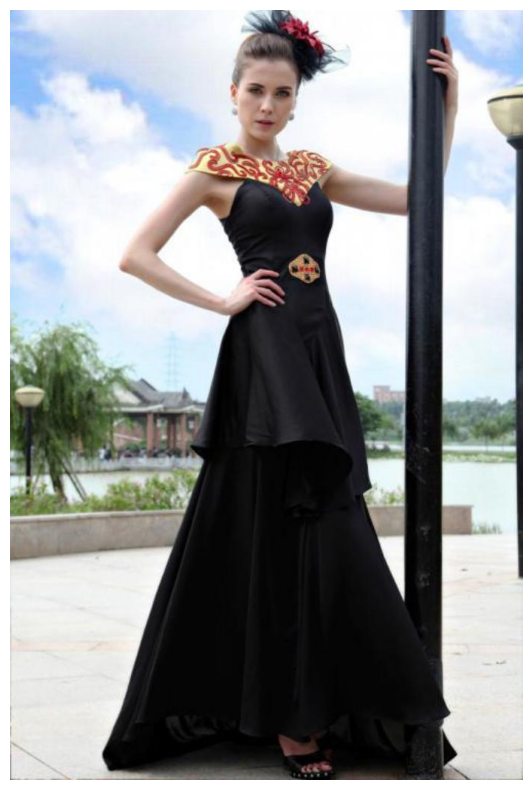

tensor([[ 120.1626,  174.1112,  578.5825, 1022.0028]])


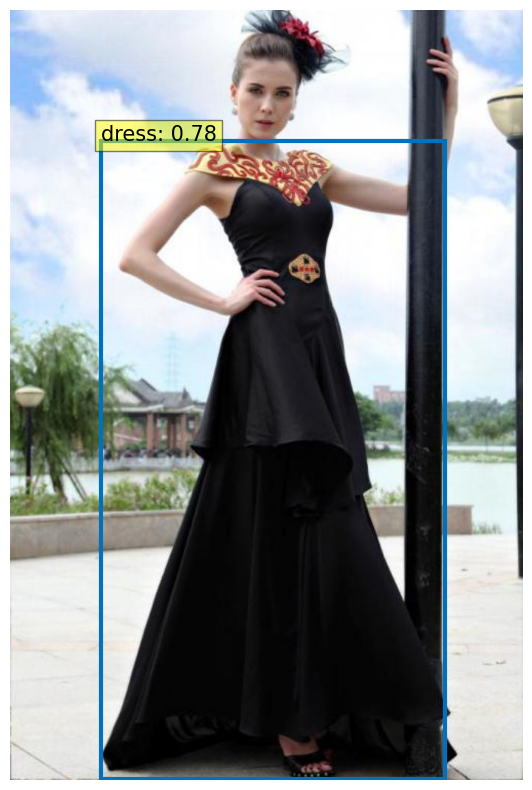

In [72]:
from PIL import Image

img_name = '/content/data/custom/train2017/000e18920575a2e59b3a0c38e6546d29.jpg'
im = Image.open(img_name)

run_worflow(im,
            model)

### With a validation image

tensor([], size=(0, 4))


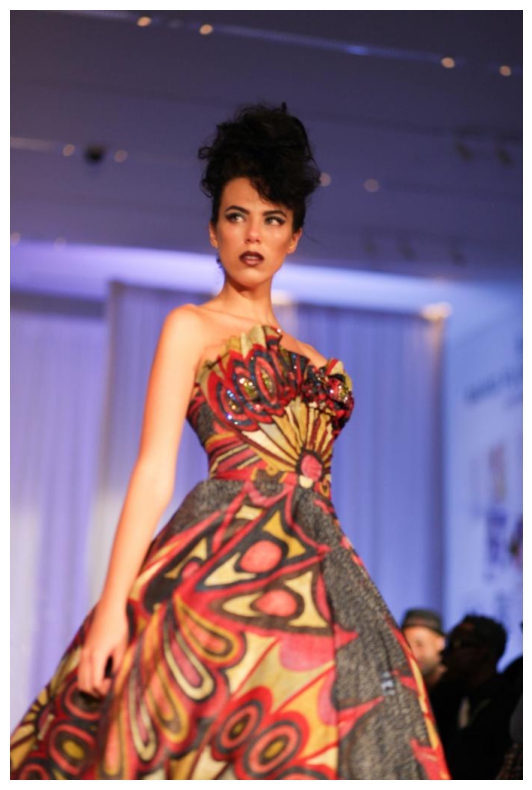

tensor([[   4.6559,  428.1960,  573.4598, 1033.9890]])


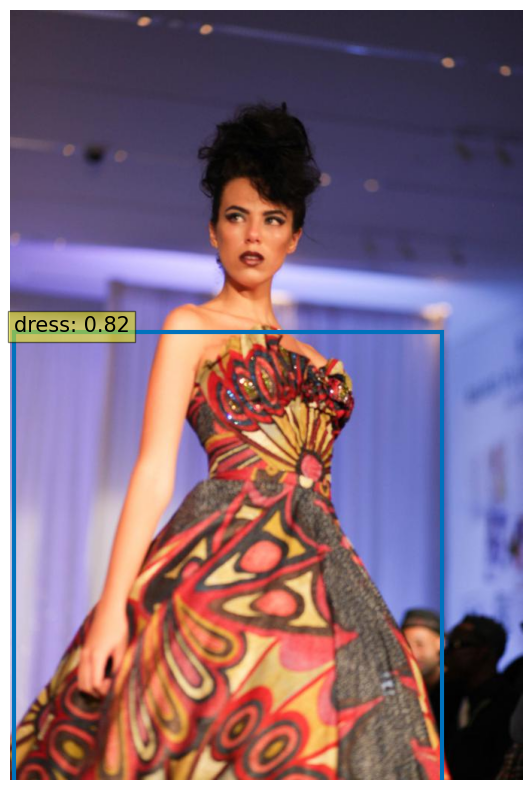

In [73]:
from PIL import Image

img_name = '/content/data/custom/val2017/010cf2ab96d1d730e15c76720af0e1a6.jpg'
im = Image.open(img_name)

run_worflow(im,
            model)